SSD_MOBILENET_V2_FPNLITE_640X640
In this google colab notebook, we make use of the SSD MobileNet V2 model to detect an object of interest (like glasses).

The pre-tranied model will be imported from the Tensorflow Model Zoo. The TensorFlow Model Zoo is a collection of pre-trained models that are ready to be used with TensorFlow. The models can be used for prediction, feature extraction, and fine-tuning.

# STEP 1
INSTALL AND IMPORT THE REQUIRED LIBRARIES

In [ ]:
!pip install --upgrade tensorflow keras numpy pandas sklearn pillow split-folders wget fast_ml tensorboard matplotlib seaborn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 511.7 MB 5.6 kB/s 
     |████████████████████████████████| 1.6 MB 30.8 MB/s 
     |████████████████████████████████| 3.1 MB 40.2 MB/s 
     |████████████████████████████████| 42 kB 776 kB/s 
     |████████████████████████████████| 5.8 MB 36.0 MB/s 
     |████████████████████████████████| 11.2 MB 19.8 MB/s 
     |████████████████████████████████| 438 kB 56.2 MB/s 
     |████████████████████████████████| 944 kB 48.8 MB/s 
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=624046fb3ff4b65e3d985da3a89b809dbcf69a80da69fb9da8e00f9dd9ad104a
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget
  Attempting uninstall: pillow
    Found existing installation: Pillow 7.1.2
    Uninstalling Pillow-7.1.2:
      Successfully uninstalled Pillow-7.1.2
  Attemptin

In [ ]:
from fast_ml.model_development import train_valid_test_split
from google.colab import drive
from keras.preprocessing.image import ImageDataGenerator
from PIL import Image
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import load_img, img_to_array


import cv2 as cv
import fnmatch
import glob
import numpy as np
import os
import pandas as pd
import re
import shutil
import splitfolders
import sys
import tensorflow as tf
import wget
import xml.etree.ElementTree as ET

from packaging import version

import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from scipy import stats
import tensorboard as tb


print(tf.__version__)

2.9.1


In [ ]:
major_ver, minor_ver, _ = version.parse(tb.__version__).release
assert major_ver >= 2 and minor_ver >= 3, \
    "This notebook requires TensorBoard 2.3 or later."
print("TensorBoard version: ", tb.__version__)

TensorBoard version:  2.9.1


# STEP 2
MOUNT GOOGLE DRIVE AND CREATE PROJECT FOLDER

In [ ]:
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
# Set your working directory to a folder in your Google Drive. This way, if your notebook times out,
# your files will be saved in your Google Drive!

# the base Google Drive directory
root_dir = "/content/drive/My Drive/"

# choose where you want your project files to be saved
project_folder = "SsdMobNet640"

def create_and_set_working_directory(project_folder):
  # check if your project folder exists. if not, it will be created.
  if os.path.isdir(root_dir + project_folder) == False:
    os.mkdir(root_dir + project_folder)
    print(root_dir + project_folder + ' did not exist but was created.')

  # change the OS to use your project folder as the working directory
  os.chdir(root_dir + project_folder)

  # create a test file to make sure it shows up in the right place
  #!touch 'new_file_in_working_directory.txt'
  print('\nYour working directory was changed to ' + root_dir + project_folder + \
        "\n\nYou can also run !pwd to confirm the current working directory." )

create_and_set_working_directory(project_folder)


Your working directory was changed to /content/drive/My Drive/SsdMobNet640

You can also run !pwd to confirm the current working directory.


In [ ]:
!pwd

/content/drive/My Drive/SsdMobNet640


In [ ]:
#Create the directories to store images and other data
os.mkdir ('data')
os.mkdir ('resources') 

In [ ]:
# this creates a symbolic link so that now the path /content/gdrive/My\ Drive/ is equal to /mydrive
!ln -s /content/drive/My\ Drive/ /mydrive

In [ ]:
!ls /mydrive/SsdMobNet640/

data  models  model_training  pretrained_models  resources


# STEP 3
ACQUIRE DATASET - LOAD DATASET FROM CLOUD FOLDER

THE FORDER STRUCTURE IS - 

```
Glasses Dataset & Annotations
  ------------All Images & Annotations
  ------------Annotations
  ------------EyeGlasses
```
TODO - Share the google drive link to the dataset

In [ ]:
from distutils.dir_util import copy_tree

from_directory = "/mydrive/Dissertation Project/Glasses Dataset & Annotations"
to_directory = "/content/drive/MyDrive/SsdMobNet640/data/dataset"

copy_tree(from_directory, to_directory)

['/content/drive/MyDrive/SsdMobNet640/data/dataset/EyeGlasses/EyeGlasses19.jpg',
 '/content/drive/MyDrive/SsdMobNet640/data/dataset/EyeGlasses/EyeGlasses20.jpg',
 '/content/drive/MyDrive/SsdMobNet640/data/dataset/EyeGlasses/EyeGlasses21.jpg',
 '/content/drive/MyDrive/SsdMobNet640/data/dataset/EyeGlasses/EyeGlasses22.jpg',
 '/content/drive/MyDrive/SsdMobNet640/data/dataset/EyeGlasses/EyeGlasses23.jpg',
 '/content/drive/MyDrive/SsdMobNet640/data/dataset/EyeGlasses/EyeGlasses24.jpg',
 '/content/drive/MyDrive/SsdMobNet640/data/dataset/EyeGlasses/EyeGlasses25.jpg',
 '/content/drive/MyDrive/SsdMobNet640/data/dataset/EyeGlasses/EyeGlasses26.jpg',
 '/content/drive/MyDrive/SsdMobNet640/data/dataset/EyeGlasses/EyeGlasses27.jpg',
 '/content/drive/MyDrive/SsdMobNet640/data/dataset/EyeGlasses/EyeGlasses28.jpg',
 '/content/drive/MyDrive/SsdMobNet640/data/dataset/EyeGlasses/EyeGlasses29.jpg',
 '/content/drive/MyDrive/SsdMobNet640/data/dataset/EyeGlasses/EyeGlasses30.jpg',
 '/content/drive/MyDrive/Ssd

In [ ]:
shutil.rmtree("/content/drive/MyDrive/SsdMobNet640/data/dataset/Annotations")
shutil.rmtree("/content/drive/MyDrive/SsdMobNet640/data/dataset/EyeGlasses")

In [ ]:
os.rename('/content/drive/MyDrive/SsdMobNet640/data/dataset/All Images & Annotations','/content/drive/MyDrive/SsdMobNet640/data/dataset/Glasses')

In [ ]:
INPUT_IMAGE_FOLDER = '/mydrive/SsdMobNet640/data/dataset/'
OUTPUT_DATA_SPLIT_FOLDER = '/mydrive/SsdMobNet640/data/dataset/'
splitfolders.ratio(INPUT_IMAGE_FOLDER, output=OUTPUT_DATA_SPLIT_FOLDER, seed=1337, ratio=(.8, .1, .1), group_prefix=2, move=False)

Copying files: 1019 files [00:32, 31.59 files/s]


In [ ]:
# Check is there are equal number of image and annotation files in the folders.
import fnmatch
dirpath = ['/content/drive/MyDrive/SsdMobNet640/data/dataset/test/Glasses', '/content/drive/MyDrive/SsdMobNet640/data/dataset/train/Glasses', '/content/drive/MyDrive/SsdMobNet640/data/dataset/val/Glasses']

for dir in dirpath:
  print ('The number of annotation files in ',dir, ' are - ', len(fnmatch.filter(os.listdir(dir), '*.xml')))
  print ('The number of image files in ',dir, ' are - ', len(fnmatch.filter(os.listdir(dir), '*.jpg')))

The number of annotation files in  /content/drive/MyDrive/SsdMobNet640/data/dataset/test/Glasses  are -  103
The number of image files in  /content/drive/MyDrive/SsdMobNet640/data/dataset/test/Glasses  are -  103
The number of annotation files in  /content/drive/MyDrive/SsdMobNet640/data/dataset/train/Glasses  are -  815
The number of image files in  /content/drive/MyDrive/SsdMobNet640/data/dataset/train/Glasses  are -  815
The number of annotation files in  /content/drive/MyDrive/SsdMobNet640/data/dataset/val/Glasses  are -  101
The number of image files in  /content/drive/MyDrive/SsdMobNet640/data/dataset/val/Glasses  are -  101


# STEP 4
BEFORE GENERATING THE LABELMAP FILE AS WELL AS THE TENSORFLOW RECORDS, WE NEED TO INSTALL THE TENSORFLOW MODELS AS WELL THE OBJECT DETECTION API

Clone the tensorflow models git repository & Install TensorFlow Object Detection API

In [ ]:
os.chdir ("/mydrive/SsdMobNet640")
!pwd

/content/drive/My Drive/SsdMobNet640


In [ ]:
# clone the tensorflow models on the colab cloud vm
!git clone --q https://github.com/tensorflow/models.git

#navigate to /models/research folder to compile protos
%cd models/research

# Compile protos.
!protoc object_detection/protos/*.proto --python_out=.

# Install TensorFlow Object Detection API.
!cp object_detection/packages/tf2/setup.py .
!python -m pip install .

fatal: destination path 'models' already exists and is not an empty directory.
/content/drive/My Drive/SsdMobNet640/models/research
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/drive/MyDrive/SsdMobNet640/models/research
  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
     |████████████████████████████████| 10.9 MB 8.3 MB/s 
     |████████████████████████████████| 352 kB 27.8 MB/s 
     |████████████████████████████████| 2.1 MB 39.1 MB/s 
     |████████████████████████████████| 25.9 MB 67.8 MB/s 
     |████████████████████████████████| 67 kB 4.1 MB/s 
     |███████████████

TEST IF THE TENSORFLOW OBJECT DETECTION API HAS BEEN INSTALLED SUCESSFULLY AND TEST THE MODEL BUILDER

In [ ]:
!pwd

/content/drive/MyDrive/SsdMobNet640/models/research


In [ ]:
# testing the model builder
!python object_detection/builders/model_builder_tf2_test.py

2022-07-28 20:12:54.596715: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
Running tests under Python 3.7.13: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
W0728 20:12:55.147224 140146583799680 model_builder.py:1102] Building experimental DeepMAC meta-arch. Some features may be omitted.
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 0.91s
I0728 20:12:55.515032 140146583799680 test_util.py:2459] time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 0.91s
[       OK ] ModelBuilderTF2Test.test_create_center_net_deepmac
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)): 0.65s
I0728 20:12:56.166256 140146583799680 test_util.py:2459] time(__main__.ModelBuilderTF2Test.test_cr

# STEP 5 
GENERATE TENSORFLOW RECORDS AND LABELMAP FILE.
WE NEED TO GENERATE THE TFRECORDS USING AN UTILITY WHICH WE WILL DOWNLOAD FROM MY GITHUB REPO

In [ ]:
from pathlib import Path
Path("/mydrive/SsdMobNet640/resources/utilities").mkdir(parents=True, exist_ok=True)

In [ ]:
os.chdir ("/mydrive/SsdMobNet640/resources/utilities")

In [ ]:
!pwd

/content/drive/My Drive/SsdMobNet640/resources/utilities


In [ ]:
!git clone https://github.com/paragsharma1/ObjectDetectionUtilityFilesTF2.x.git

Cloning into 'ObjectDetectionUtilityFilesTF2.x'...
remote: Enumerating objects: 4, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 4 (delta 0), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (4/4), done.


In [ ]:
!pwd

/content/drive/My Drive/SsdMobNet640/resources/utilities


Create the CSV files and the "label_map.pbtxt" file
Current working directory - /content/drive/MyDrive/SsdMobNet320/data

The xml_to_csv script needs to be run to create test_labels.csv and train_labels.csv files. This also creates the label_map.pbtxt file using the classes mentioned in the xml files.

In [ ]:
os.chdir('/mydrive/SsdMobNet640/data/')

In [ ]:
from pathlib import Path
Path("/mydrive/SsdMobNet640/data/LabelMap_TFRecords").mkdir(parents=True, exist_ok=True)

In [ ]:
os.chdir('/content/drive/MyDrive/SsdMobNet640/data/LabelMap_TFRecords')
!pwd

/content/drive/MyDrive/SsdMobNet640/data/LabelMap_TFRecords


In [ ]:
def xml_to_csv(path):
  classes_names = []
  xml_list = []

  for xml_file in glob.glob(path + '/*.xml'):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    for member in root.findall('object'):
      classes_names.append(member[0].text)
      value = (root.find('filename').text,   
               int(root.find('size/width').text),
               int(root.find('size/height').text),
               root.find('object/name').text,
               int(root.find('object/bndbox/xmin').text),
               int(root.find('object/bndbox/ymin').text),
               int(root.find('object/bndbox/xmax').text),
               int(root.find('object/bndbox/ymax').text))
      xml_list.append(value)
      print(value)
  column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
  xml_df = pd.DataFrame(xml_list, columns=column_name) 
  classes_names = list(set(classes_names))
  classes_names.sort()
  return xml_df, classes_names

In [ ]:
for label_path in ['/mydrive/SsdMobNet640/data/dataset/train/Glasses', '/mydrive/SsdMobNet640/data/dataset/test/Glasses']:
  #image_path = os.path.join(os.getcwd(), label_path)
  #print(image_path)
  print(label_path)
  xml_df, classes = xml_to_csv(label_path)
  xml_df.to_csv(f'{label_path}.csv', index=None)
  print(f'Successfully converted {label_path} xml to csv.')

label_map_path = os.path.join("label_map.pbtxt")
pbtxt_content = ""

for i, class_name in enumerate(classes):
    pbtxt_content = (
        pbtxt_content
        + "item {{\n    id: {0}\n    name: '{1}'\n}}\n\n".format(i + 1, class_name)
    )
pbtxt_content = pbtxt_content.strip()
with open(label_map_path, "w") as f:
    f.write(pbtxt_content)
    print('Successfully created label_map.pbtxt ')   

/mydrive/SsdMobNet640/data/dataset/train/Glasses
('EyeGlasses1005.jpg', 3000, 4000, 'Glasses', 1224, 2227, 1385, 2390)
('EyeGlasses1005.jpg', 3000, 4000, 'Glasses', 1224, 2227, 1385, 2390)
('EyeGlasses1005.jpg', 3000, 4000, 'Glasses', 1224, 2227, 1385, 2390)
('EyeGlasses9.jpg', 1920, 1200, 'Glasses', 651, 517, 1218, 1049)
('EyeGlasses557.jpg', 437, 400, 'Glasses', 69, 80, 232, 158)
('EyeGlasses483.jpg', 3648, 2736, 'Glasses', 518, 891, 3139, 2031)
('EyeGlasses763.jpg', 700, 700, 'Glasses', 33, 153, 669, 565)
('EyeGlasses182.jpg', 1920, 1200, 'Glasses', 244, 779, 789, 1200)
('EyeGlasses182.jpg', 1920, 1200, 'Glasses', 244, 779, 789, 1200)
('EyeGlasses182.jpg', 1920, 1200, 'Glasses', 244, 779, 789, 1200)
('EyeGlasses182.jpg', 1920, 1200, 'Glasses', 244, 779, 789, 1200)
('EyeGlasses242.jpg', 3072, 2048, 'Glasses', 141, 1, 2240, 1450)
('EyeGlasses57.jpg', 1920, 1200, 'Glasses', 767, 340, 945, 1001)
('EyeGlasses584.jpg', 644, 362, 'Glasses', 26, 68, 624, 355)
('EyeGlasses190.jpg', 1920, 120

Here we will use the generate_tfrecord.py to create train.record & test.record files.
The current working directory is /content/drive/MyDrive/SsdMobNet640/data/LabelMap_TFRecords. 

In [ ]:
!pwd

/content/drive/MyDrive/SsdMobNet640/data/LabelMap_TFRecords


In [ ]:
#Usage:  
#!python generate_tfrecord.py output.csv output_pb.txt /path/to/images output.tfrecords

#For train.record
!python /mydrive/SsdMobNet640/resources/utilities/ObjectDetectionUtilityFilesTF2.x/generate_tfrecord.py /mydrive/SsdMobNet640/data/dataset/train/Glasses.csv  label_map.pbtxt /mydrive/SsdMobNet640/data/dataset/train/Glasses/ train.record

#For test.record
!python /mydrive/SsdMobNet640/resources/utilities/ObjectDetectionUtilityFilesTF2.x/generate_tfrecord.py /mydrive/SsdMobNet640/data/dataset/test/Glasses.csv  label_map.pbtxt /mydrive/SsdMobNet640/data/dataset/test/Glasses/ test.record

groups: 100% 815/815 [00:06<00:00, 131.05it/s]
Successfully created the TFRecords: /content/drive/My Drive/SsdMobNet640/data/LabelMap_TFRecords/train.record
groups: 100% 103/103 [00:00<00:00, 155.64it/s]
Successfully created the TFRecords: /content/drive/My Drive/SsdMobNet640/data/LabelMap_TFRecords/test.record


# STEP 6

DOWNLOAD THE PRE-TRAINED SSD_MOBILENET_V2_FPNLITE_640X640_COCO17 MODEL FROM THE TENSORFLOW MODEL ZOO. 

CURRENT WORKING DIRECTORY - /content/drive/MyDrive/SsdMobNet640/pretrained_models/SSDMobileNetv2FPNLite640x640

UNZIP THE ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz
LIST OF DETECTION CHECKPOINTS FOR TF 2.x WILL BE AVAILABLE HERE

In [ ]:
from pathlib import Path
Path("/mydrive/SsdMobNet640/pretrained_models/SSDMobileNetv2FPNLite640x640").mkdir(parents=True, exist_ok=True)

In [ ]:
os.chdir("/mydrive/SsdMobNet640/pretrained_models/SSDMobileNetv2FPNLite640x640")
!pwd

/content/drive/My Drive/SsdMobNet640/pretrained_models/SSDMobileNetv2FPNLite640x640


In [ ]:
#Download the pre-trained model ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz into the data folder & unzip it.

!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz
!tar -xzvf ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz

--2022-07-20 01:40:42--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.250.145.128, 2a00:1450:4013:c14::80
Connecting to download.tensorflow.org (download.tensorflow.org)|142.250.145.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20518283 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.57M  28.9MB/s    in 0.7s    

2022-07-20 01:40:43 (28.9 MB/s) - ‘ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz’ saved [20518283/20518283]

ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/
ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/checkpoint/
ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/checkpoint/checkpoint
ssd_mobilenet_v2_fpnlite_640x640_coco17_tp

# STEP 7
MAKE RELEVANT CHANGE IN THE MODEL PIPELINE CONFIG FILE

Edit the config file relevant to the downloaded model. In our case, we will have to copy the 'pipeline.config' file from '/content/drive/MyDrive/SsdMobNet640/pretrained_models/SSDMobileNetv2FPNLite640x640/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8' directory to '/content/drive/MyDrive/SsdMobNet640/model_training' directory and then edit the file.

We need to make the following changes:

* num_classes to the number of classes we are detecting.In our case its 1.
* test.record path, train.record path & labelmap paths to match our files.
* fine_tune_checkpoint to the path of the directory where the downloaded checkpoint is.
* fine_tune_checkpoint_type to detection
* batch_size to 64 (reduce if the notebook  crashes)
* change num_steps 60000


Save the file.

In [ ]:
from pathlib import Path
Path("/mydrive/SsdMobNet640/model_training").mkdir(parents=True, exist_ok=True)

In [ ]:
os.chdir('/mydrive/SsdMobNet640/model_training')
!pwd

/content/drive/My Drive/SsdMobNet640/model_training


In [ ]:
SOURCE_CONFIG_FILE_PATH = '/mydrive/SsdMobNet640/pretrained_models/SSDMobileNetv2FPNLite640x640/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/pipeline.config'
DEST_CONFIG_FILE_PATH = '/mydrive/SsdMobNet640/model_training'
shutil.copy(SOURCE_CONFIG_FILE_PATH, DEST_CONFIG_FILE_PATH)

'/mydrive/SsdMobNet640/model_training/pipeline.config'

# STEP 8 
LOAD TENSORBOARD

Tensorboard is a visualization tool for TensorFlow. It is used to visualize the data flow graphs and track the training progress.

In [ ]:
#load tensorboard

%load_ext tensorboard         
%tensorboard --logdir '/mydrive/SsdMobNet640/model_training'

<IPython.core.display.Javascript object>

UPLOAD THE LOG FILE TO THE TENSORBOARD.DEV FOR CUSTOM PLOT TO GENERATE AN EXPERIMENT ID WHICH CAN THEN BE USED FOR CUSTOM PLOTTING (REF - https://www.tensorflow.org/tensorboard/dataframe_api)
**Experiment ID for Loss Metrics**

In [ ]:
!tensorboard dev upload --logdir /content/drive/MyDrive/SsdMobNet640/model_training/train \
  --name "MobileNetv2_640x640 Glasses Dataset Training " \
  --description "MobileNetv2_640x640 Glasses Dataset Training" \
  --one_shot

2022-07-28 13:05:34.103976: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected

***** TensorBoard Uploader *****

This will upload your TensorBoard logs to https://tensorboard.dev/ from
the following directory:

/content/drive/MyDrive/SsdMobNet640/model_training/train

This TensorBoard will be visible to everyone. Do not upload sensitive
data.

Your use of this service is subject to Google's Terms of Service
<https://policies.google.com/terms> and Privacy Policy
<https://policies.google.com/privacy>, and TensorBoard.dev's Terms of Service
<https://tensorboard.dev/policy/terms/>.

This notice will not be shown again while you are logged into the uploader.
To log out, run `tensorboard dev auth revoke`.

Continue? (yes/NO) yes

Please visit this URL to authorize this application: https://accounts.google.com/o/oauth2/auth?response_type=code&client_id=373649185512-8v619h5kft38l4456nm2dj4ubeqsrvh6.apps.googleu

In [ ]:
experiment_id = "ibHxxXWuRA67akiMbzy6HA"
experiment = tb.data.experimental.ExperimentFromDev(experiment_id)
df = experiment.get_scalars()
df

,run,tag,step,value
0,.,Loss/classification_loss,100,0.370431
1,.,Loss/classification_loss,200,0.208862
2,.,Loss/classification_loss,300,0.210959
3,.,Loss/classification_loss,400,0.194366
4,.,Loss/classification_loss,500,0.199034
...,...,...,...,...
3595,.,steps_per_sec,59600,1.128357
3596,.,steps_per_sec,59700,1.122368
3597,.,steps_per_sec,59800,1.105512
3598,.,steps_per_sec,59900,1.110397


In [ ]:
print(df["run"].unique())
print(df["tag"].unique())

['.']
['Loss/classification_loss' 'Loss/localization_loss'
 'Loss/regularization_loss' 'Loss/total_loss' 'learning_rate'
 'steps_per_sec']


In [ ]:
dfw = experiment.get_scalars(pivot=True) 
dfw

,run,step,Loss/classification_loss,Loss/localization_loss,Loss/regularization_loss,Loss/total_loss,learning_rate,steps_per_sec
0,.,100,0.370431,0.369181,0.151750,0.891362,3.199940e-02,0.671534
1,.,200,0.208862,0.151736,0.151955,0.512552,3.733280e-02,1.105544
2,.,300,0.210959,0.133330,0.152074,0.496363,4.266620e-02,1.104381
3,.,400,0.194366,0.152902,0.152217,0.499485,4.799960e-02,1.110159
4,.,500,0.199034,0.164471,0.152466,0.515971,5.333300e-02,1.112626
...,...,...,...,...,...,...,...,...
595,.,59600,0.019236,0.002271,0.046954,0.068460,9.071827e-06,1.128357
596,.,59700,0.016822,0.002275,0.046953,0.066051,5.102158e-06,1.122368
597,.,59800,0.022247,0.002926,0.046953,0.072126,2.267361e-06,1.105512
598,.,59900,0.016344,0.001749,0.046953,0.065046,5.674362e-07,1.110397


In [ ]:
csv_path = '/content/drive/MyDrive/SsdMobNet640/model_training/train/SsdMobNet640_tb_experiment_1.csv'
dfw.to_csv(csv_path, index=False)
dfw_roundtrip = pd.read_csv(csv_path)
pd.testing.assert_frame_equal(dfw_roundtrip, dfw)

Text(0.5, 1.0, 'learning rate')

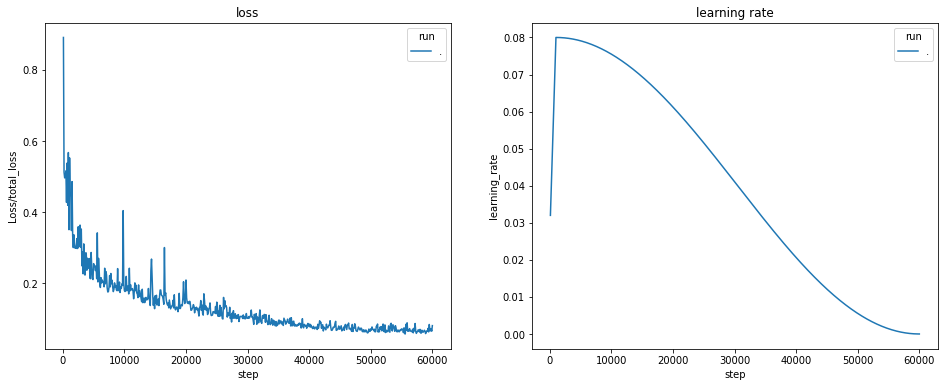

In [ ]:
# Filter the DataFrame to only validation data, which is what the subsequent
# analyses and visualization will be focused on.
dfw_validation = dfw
# Get the optimizer value for each row of the validation DataFrame.
optimizer_validation = dfw_validation.run.apply(lambda run: run.split(",")[0])

plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
sns.lineplot(data=dfw_validation, x="step", y="Loss/total_loss",
             hue=optimizer_validation).set_title("loss")
plt.subplot(1, 2, 2)
sns.lineplot(data=dfw_validation, x="step", y="learning_rate",
             hue=optimizer_validation).set_title("learning rate")

**UPLOAD THE EVALUATION LOG FILE TO TENSORFLOW.DEV FROM THE EVALUATION FOLDER**

In [ ]:
!tensorboard dev upload --logdir /content/drive/MyDrive/SsdMobNet640/model_training/eval \
  --name "MobileNetv2_MobNetv2_640 Glasses Dataset Training - evaluation log file  " \
  --description "MobileNetv2 Glasses Dataset Training - evaluation log file" \
  --one_shot

2022-07-28 15:14:03.732649: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected

New experiment created. View your TensorBoard at: https://tensorboard.dev/experiment/a7SdhEe5R5iKKrZGTX0mnQ/

[2022-07-28T15:14:04] Started scanning logdir.
[2022-07-28T15:14:04] Total uploaded: 16 scalars, 0 tensors, 0 binary objects
[2022-07-28T15:14:04] Done scanning logdir.


Done. View your TensorBoard at https://tensorboard.dev/experiment/a7SdhEe5R5iKKrZGTX0mnQ/


In [ ]:
experiment_id_acc = "a7SdhEe5R5iKKrZGTX0mnQ"
experiment_acc = tb.data.experimental.ExperimentFromDev(experiment_id_acc)
df_acc = experiment.get_scalars()
df_acc

,run,tag,step,value
0,.,Loss/classification_loss,100,0.370431
1,.,Loss/classification_loss,200,0.208862
2,.,Loss/classification_loss,300,0.210959
3,.,Loss/classification_loss,400,0.194366
4,.,Loss/classification_loss,500,0.199034
...,...,...,...,...
3595,.,steps_per_sec,59600,1.128357
3596,.,steps_per_sec,59700,1.122368
3597,.,steps_per_sec,59800,1.105512
3598,.,steps_per_sec,59900,1.110397


In [ ]:
print(df_acc["run"].unique())
print(df_acc["tag"].unique())

['.']
['Loss/classification_loss' 'Loss/localization_loss'
 'Loss/regularization_loss' 'Loss/total_loss' 'learning_rate'
 'steps_per_sec']


In [ ]:
dfw_acc = experiment_acc.get_scalars(pivot=True) 
dfw_acc

,run,step,DetectionBoxes_Precision/mAP,DetectionBoxes_Precision/mAP (large),DetectionBoxes_Precision/mAP (medium),DetectionBoxes_Precision/mAP (small),DetectionBoxes_Precision/mAP@.50IOU,DetectionBoxes_Precision/mAP@.75IOU,DetectionBoxes_Recall/AR@1,DetectionBoxes_Recall/AR@10,DetectionBoxes_Recall/AR@100,DetectionBoxes_Recall/AR@100 (large),DetectionBoxes_Recall/AR@100 (medium),DetectionBoxes_Recall/AR@100 (small),Loss/classification_loss,Loss/localization_loss,Loss/regularization_loss,Loss/total_loss
0,.,60000,0.448674,0.510976,0.276968,0.521782,0.599422,0.477483,0.461702,0.494326,0.513475,0.571154,0.332353,0.566667,1.21714,0.220783,0.046953,1.484877


In [ ]:
csv_path_acc = '/content/drive/MyDrive/SsdMobNet640/model_training/eval/SsdMobNet640_tb_experiment_1.csv'
dfw_acc.to_csv(csv_path_acc, index=False)
dfw_acc_roundtrip = pd.read_csv(csv_path_acc)
pd.testing.assert_frame_equal(dfw_acc_roundtrip, dfw_acc)

0    .
Name: run, dtype: object


Text(0.5, 1.0, 'Recall')

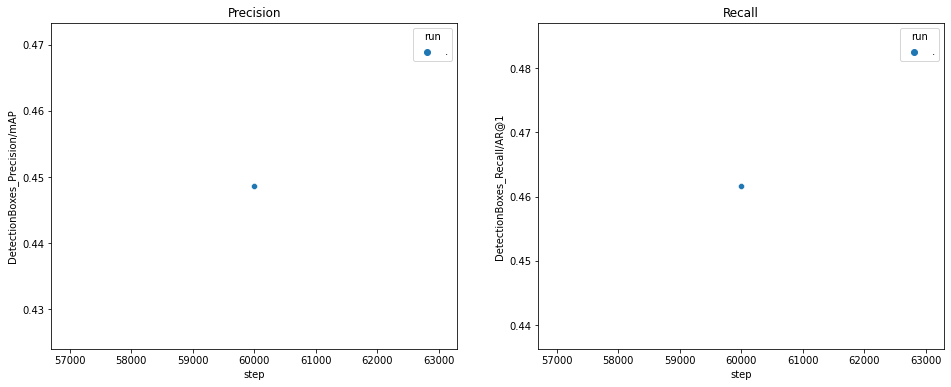

In [ ]:
# Filter the DataFrame to only validation data, which is what the subsequent
# analyses and visualization will be focused on.
dfw_eval = dfw_acc
# Get the optimizer value for each row of the validation DataFrame.
optimizer_validation = dfw_eval.run.apply(lambda run: run.split(",")[0])
print(optimizer_validation)
plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
sns.scatterplot(data=dfw_eval, x="step", y="DetectionBoxes_Precision/mAP", hue=optimizer_validation).set_title("Precision")
#sns.lineplot(data=dfw_eval, x="step", y="DetectionBoxes_Precision/mAP	", hue=optimizer_validation).set_title("loss")
plt.subplot(1, 2, 2)
sns.scatterplot(data=dfw_eval, x="step", y="DetectionBoxes_Recall/AR@1", hue=optimizer_validation).set_title("Recall")

# STEP 9

PRE-REQUISITES BEFORE TRAINIG THE MODEL - 
CHECK OPENCV PACKAGES - THEY SHOULD HAVE THE SAME VERSION.

```
opencv-contrib-python         4.1.2.30
opencv-python                 4.1.2.30
opencv-python-headless        4.1.2.30
```

IF NOT SAME THEN UNINSTALL 'OPENCV-PYTHON-HEADLESS' AND REINSTALL THE CORRECT VERSION.

YOU WILL HAVE TO RESTART RUNTIME AFTER REINSTALLING THE CORRECT VERSION.

AFTER RUNTIME RESTART, RE-RUN THE FOLLOWING STEPS ONCE AGAIN - 


1. STEP 1
2. STEP 2
3. STEP 4
4. STEP 8
5. STEP 9 (SOME STEPS)

CHECK THE VERSION ONCE AGAIN. ALL THE OPENCV VERSIONS SHOULD NOW BE SAME.

LASTLY INSTALL THE libcudnn8=8.1.0.77-1+cuda11.2


In [ ]:
%cd /mydrive/SsdMobNet640/models/research/object_detection

/content/drive/My Drive/SsdMobNet640/models/research/object_detection


In [ ]:
!pip list|grep opencv

opencv-contrib-python         4.6.0.66
opencv-python                 4.6.0.66
opencv-python-headless        4.6.0.66


In [ ]:
#RUN ONLY IF THE VERSION IS NOT SAME
!pip uninstall opencv-python-headless --y

Found existing installation: opencv-python-headless 4.6.0.66
Uninstalling opencv-python-headless-4.6.0.66:
  Successfully uninstalled opencv-python-headless-4.6.0.66


In [ ]:
#RUN ONLY IF THE VERSION IS NOT SAME
!pip install opencv-python-headless==4.1.2.30

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 21.8 MB 193 kB/s 


In [ ]:
!apt install --allow-change-held-packages libcudnn8=8.1.0.77-1+cuda11.2

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following packages will be REMOVED:
  libcudnn8-dev
The following held packages will be changed:
  libcudnn8
The following packages will be upgraded:
  libcudnn8
1 upgraded, 0 newly installed, 1 to remove and 47 not upgraded.
Need to get 430 MB of archives.
After this operation, 3,139 MB disk space will be freed.
Get:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  libcudnn8 8.1.0.77-1+cuda11.2 [430 MB]
Fetched 430 MB in 18s (23.4 MB/s)
(Reading database ... 155653 files and directories currently installed.)
Removing libcudnn8-dev (8.0.5.39-1+cuda11.1) ...
(Reading database ... 155631 files and directories currently installed.)
Preparing to unpack .../libcudnn8_8.1.0.77-1+cuda11.2_amd64.deb ...
Unpacking libcudnn8 (8.1.0.77-1+

# STEP 10
RUN THIS COMMAND TO TRAIN THE MODEL

In [ ]:
!python model_main_tf2.py --pipeline_config_path=/mydrive/SsdMobNet640/model_training/pipeline.config --model_dir=/mydrive/SsdMobNet640/model_training --alsologtostderr

# Run evaluation metrics

In [ ]:
# Evaluation metrics for SSD MOBILENET v2 FPNLITE 640x640 
!python model_main_tf2.py --pipeline_config_path=/mydrive/SsdMobNet640/model_training/pipeline.config --model_dir=/content/drive/MyDrive/SsdMobNet640/model_training --checkpoint_dir=/content/drive/MyDrive/SsdMobNet640/model_training

2022-07-28 13:19:07.895915: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
W0728 13:19:07.901823 139704181602176 model_lib_v2.py:1090] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I0728 13:19:07.902220 139704181602176 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0728 13:19:07.902319 139704181602176 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I0728 13:19:07.902397 139704181602176 config_util.py:552] Maybe overwriting eval_num_epochs: 1
W0728 13:19:07.902511 139704181602176 model_lib_v2.py:1110] Expected number of evaluation epochs is 1, but instead encountered `eval_on_train_input_config.num_epochs` = 0. Overwriting `num_epochs` to 1.
INFO:tensorflow:Reading unweighted datase

# Testing the trained model

In [ ]:
!pwd

/content/drive/My Drive/SsdMobNet640/models/research/object_detection


In [ ]:
# Export inference graph 
# Current working directory is /content/models/research/object_detection
#SSD MOBILENET v2 FPNLITE 640x640 
!python exporter_main_v2.py --trained_checkpoint_dir=/content/drive/MyDrive/SsdMobNet640/model_training --pipeline_config_path=/content/drive/MyDrive/SsdMobNet640/model_training/pipeline.config --output_directory /content/drive/MyDrive/SsdMobNet640/inference_graph

2022-07-28 20:21:11.991246: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W0728 20:21:13.308578 140669363955584 deprecation.py:628] From /usr/local/lib/python3.7/dist-packages/tensorflow/python/autograph/impl/api.py:458: calling map_fn_v2 (from tensorflow.python.ops.map_fn) with back_prop=False is deprecated and will be removed in a future version.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W0728 20:21:39.901005 140669363955584 save_impl.py:72] Skipping full serialization of Ker

In [ ]:
# Different font-type for labels text.(This step is optional)
!wget https://freefontsdownload.net/download/160187/arial.zip
!unzip arial.zip -d .

%cd utils/
!sed -i "s/font = ImageFont.truetype('arial.ttf', 24)/font = ImageFont.truetype('arial.ttf', 50)/" visualization_utils.py
%cd ..

--2022-07-28 20:17:34--  https://freefontsdownload.net/download/160187/arial.zip
Resolving freefontsdownload.net (freefontsdownload.net)... 104.21.75.182, 172.67.180.27, 2606:4700:3036::6815:4bb6, ...
Connecting to freefontsdownload.net (freefontsdownload.net)|104.21.75.182|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 172804 (169K) [application/force-download]
Saving to: ‘arial.zip.1’

arial.zip.1         100%[===================>] 168.75K  --.-KB/s    in 0.1s    

2022-07-28 20:17:34 (1.53 MB/s) - ‘arial.zip.1’ saved [172804/172804]

Archive:  arial.zip
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@#################################@
@#        Downloaded from        #@
@#                               #@
@#   www.FreeFontsDownload.net   #@
@#                               #@
@# ---------- More site -------- #@
@#      https://funnytv.net      #@
@#                               #@
@#                               #@
@#################################@
@@@@@@@@@@@@@@

In [ ]:
#Loading the saved_model
import tensorflow as tf
import time
import numpy as np
import warnings
warnings.filterwarnings('ignore')
from PIL import Image
from google.colab.patches import cv2_imshow
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

IMAGE_SIZE = (12, 8) # Output display size as you want
import matplotlib.pyplot as plt
PATH_TO_SAVED_MODEL="/content/drive/MyDrive/SsdMobNet640/inference_graph/saved_model"
print('Loading model...', end='')

# Load saved model and build the detection function
##detect_fn=tf.saved_model.load(PATH_TO_SAVED_MODEL)
saved_model_after_training = tf.saved_model.load(PATH_TO_SAVED_MODEL)
print('Done!')

#Loading the label_map
category_index=label_map_util.create_category_index_from_labelmap("/content/drive/MyDrive/SsdMobNet640/data/LabelMap_TFRecords/label_map.pbtxt",use_display_name=True)
#category_index=label_map_util.create_category_index_from_labelmap([path_to_label_map],use_display_name=True)

def load_image_into_numpy_array(path):

    return np.array(Image.open(path))



Loading model...Done!


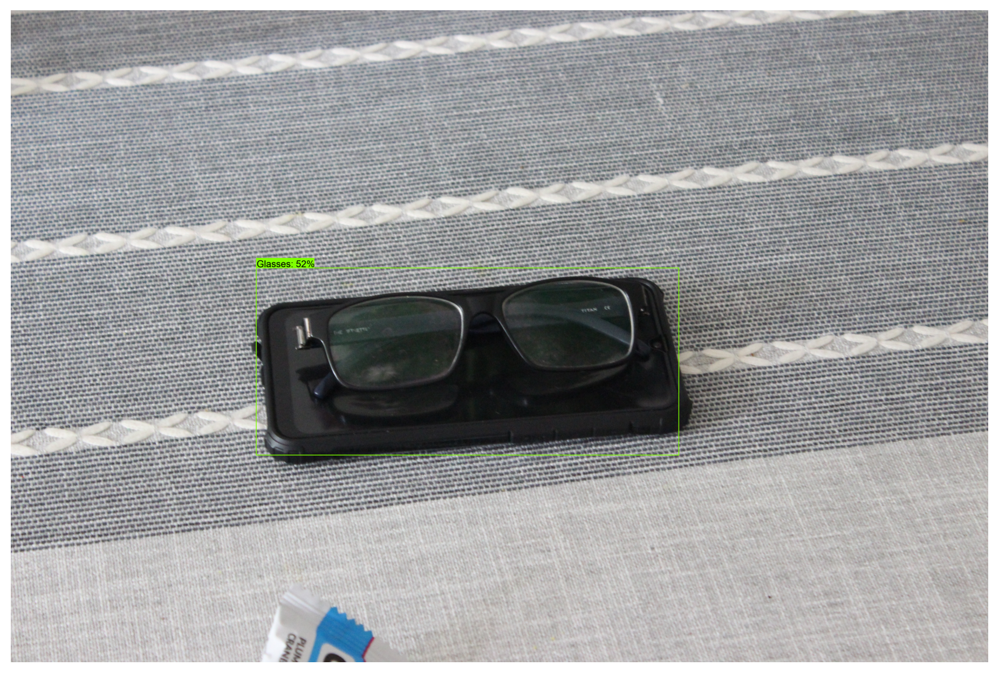

In [ ]:
image_path = "/content/drive/MyDrive/SsdMobNet640/data/dataset/val/Glasses/EyeGlasses864.jpg"
#print('Running inference for {}... '.format(image_path), end='')

image_np = load_image_into_numpy_array(image_path)

# The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
input_tensor = tf.convert_to_tensor(image_np)
# The model expects a batch of images, so add an axis with `tf.newaxis`.
input_tensor = input_tensor[tf.newaxis, ...]

detections = saved_model_after_training(input_tensor)

# All outputs are batches tensors.
# Convert to numpy arrays, and take index [0] to remove the batch dimension.
# We're only interested in the first num_detections.
num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
              for key, value in detections.items()}
detections['num_detections'] = num_detections

# detection_classes should be ints.
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'],
      detections['detection_classes'],
      detections['detection_scores'],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=4,
      min_score_thresh=.25, # Adjust this value to set the minimum probability boxes to be classified as True
      agnostic_mode=False)
%matplotlib inline
plt.figure(figsize=IMAGE_SIZE, dpi=200)
plt.axis("off")
plt.imshow(image_np_with_detections)
plt.show()

# Load a checkpoint

In [ ]:
import os
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder
from object_detection.utils import config_util

In [ ]:
CONFIG_PATH = '/content/drive/MyDrive/customTF6/data/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config'
CHECKPOINT_PATH = '/content/drive/MyDrive/customTF6/model_training'

In [ ]:
latest = tf.train.latest_checkpoint(CHECKPOINT_PATH)

In [ ]:
print(latest)

/content/drive/MyDrive/customTF6/model_training/ckpt-51


In [ ]:
model = tf.saved_model.load('/content/drive/MyDrive/customTF6/data/inference_graph/saved_model')

In [ ]:
print(model)

<tensorflow.python.saved_model.load.Loader._recreate_base_user_object.<locals>._UserObject object at 0x7fc4b76bac50>
